In [1]:
# !pip install pyshp
import pandas as pd

def read_shapefile(shp_path):
	"""
	Read a shapefile into a Pandas dataframe with a 'coords' column holding
	the geometry information. This uses the pyshp package
	"""
	import shapefile

	#read file, parse out the records and shapes
	sf = shapefile.Reader(shp_path)
	fields = [x[0] for x in sf.fields][1:]
	records = sf.records()
	shps = [s.points for s in sf.shapes()]

	#write into a dataframe
	df = pd.DataFrame(columns=fields, data=records)
	df = df.assign(coords=shps)

	return df

In [2]:
# df = read_shapefile('Outdoor_Inventory_AV.shp')

In [16]:
import pandas as pd

df = pd.read_csv('data/df_reverse_coords.csv')

In [ ]:
# Filtrar lisboa e porto

In [ ]:
# Features:
# Para um par (X, Y), calcular número de outdoors vizinhos

# Modelo para prever o número de pessoas que vêem os outdoors num dado dia:
# Freguesia
# Densidade Populacional
# Pontos de interesse em redor dessa região (proxy de desenvolvimento)

In [17]:
df.head(3)

,Unnamed: 0,PanelID,X,Y,Max_Visibi,Average_Da,freguesia,concelho,distrito
0,0,3,-8.501357,40.126293,180,3032.0,Condeixa-a-Nova,Condeixa-A-Nova,Coimbra
1,1,4,-9.103966,38.808856,180,22893.0,Bobadela,Loures,Lisbon
2,2,5,-8.622777,41.241615,180,20946.0,Maia,Maia,Porto


In [29]:
df[df.PanelID == 48084]

,Unnamed: 0,PanelID,X,Y,Max_Visibi,Average_Da,freguesia,concelho,distrito
29472,29472,48084,-9.290662,38.75665,145,6422.0,Cacem,Sintra,Lisbon


In [27]:
df_sampling = df[df.distrito == 'Lisbon']

In [28]:
import folium

m = folium.Map(location=[38.760398,-9.190202], zoom_start=13)

for indice, row in df_sampling.iterrows():
      folium.CircleMarker(location=[row["Y"], row["X"]],
                          color="crimson", fill_color="crimson", tooltip=row["PanelID"], fill=True,
                          radius=3).add_to(m)
        
        
m

In [9]:
df.groupby(['X', 'Y']).PanelID.count().sort_values()

X          Y        
-9.475810  38.815709     1
-8.629710  41.035395     1
-8.629713  41.234399     1
-8.629715  41.093727     1
-8.629724  41.234395     1
                        ..
-8.890420  38.530000     4
-9.235608  38.760009     4
-8.669275  41.238443     4
-9.167858  38.741668     6
-9.128028  38.620447    11
Name: PanelID, Length: 28638, dtype: int64

In [21]:
df.X.value_counts()

-9.128028    11
-9.167858     6
-8.414006     5
-9.152100     5
-9.169225     5
             ..
-8.565060     1
-9.399769     1
-9.149726     1
-9.054554     1
-8.439670     1
Name: X, Length: 26684, dtype: int64

In [13]:
df[df.X == -9.128028]# 38.620447]]]

,PanelID,X,Y,Max_Visibi,Average_Da,coords
275,31491,-9.128028,38.620447,69,132.0,"[[-9.128028, 38.620447]]"
777,31493,-9.128028,38.620447,69,363.0,"[[-9.128028, 38.620447]]"
951,31482,-9.128028,38.620447,69,458.0,"[[-9.128028, 38.620447]]"
1702,31483,-9.128028,38.620447,69,836.0,"[[-9.128028, 38.620447]]"
1795,31418,-9.128028,38.620447,69,880.0,"[[-9.128028, 38.620447]]"
2170,31492,-9.128028,38.620447,69,1062.0,"[[-9.128028, 38.620447]]"
2445,31486,-9.128028,38.620447,69,1193.0,"[[-9.128028, 38.620447]]"
2681,31494,-9.128028,38.620447,69,1295.0,"[[-9.128028, 38.620447]]"
2925,31485,-9.128028,38.620447,69,1387.0,"[[-9.128028, 38.620447]]"
3286,31417,-9.128028,38.620447,69,1543.0,"[[-9.128028, 38.620447]]"


C:\Users\paulo\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Max_Visibi', ylabel='Density'>

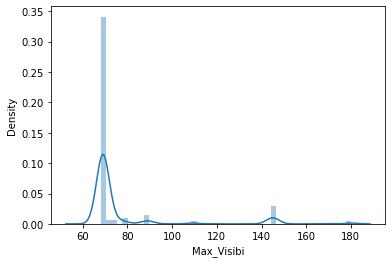

In [14]:
import seaborn as sns

sns.distplot(df.Max_Visibi)

In [15]:
df.Max_Visibi.value_counts()

69     24653
145     2172
89       945
78       716
75       468
71       375
109      309
180      287
88       121
72        88
118       57
81        29
63        29
86        27
96        23
91        18
162       15
73        10
94         8
169        7
61         3
160        3
100        2
83         2
130        2
174        2
101        1
141        1
178        1
159        1
Name: Max_Visibi, dtype: int64